# A Look Into Common Crawl Google Scholar Alerts 2016 – Present

Academic articles and publications mentioning Common Crawl are extracted from [Google Scholar](https://scholar.google.com/) alert mails received from April 2016 to date. This notebook tries to get some insights from the publications contained in the alert emails.

In [1]:
import pandas as pd

df = pd.read_json('citations.jsonl', lines=True)
df.shape

(10890, 5)

## Scholar Alert Citations By Year

In [2]:
# citations per year (first and last year incomplete)

citations_by_year = df['year'].value_counts(sort=False)
citations_by_year

year
2016     196
2017     316
2018     533
2019     710
2020     977
2021    1105
2022    1266
2023    1777
2024    2300
2025    1710
Name: count, dtype: int64

In [3]:
# add rough numbers for prior years obtained by counting results in Google Scholar Search
citations_by_year[2012] = 30
citations_by_year[2013] = 80
citations_by_year[2014] = 173
citations_by_year[2015] = 213
citations_by_year = citations_by_year.rename_axis('year').reset_index(name='citations')
citations_by_year

,year,citations
0,2016,196
1,2017,316
2,2018,533
3,2019,710
4,2020,977
5,2021,1105
6,2022,1266
7,2023,1777
8,2024,2300
9,2025,1710


/usr/lib/python3/dist-packages/rpy2/robjects/lib/ggplot2.py:70: UserWarning: This was designed against ggplot2 versions starting with 3.3. but you have 3.5.1
  warnings.warn(


Saving 7 x 7 in image


R[write to console]: 6: `aes_string()` was deprecated in ggplot2 3.0.0.
ℹ Please use tidy evaluation idioms with `aes()`.
ℹ See also `vignette("ggplot2-in-packages")` for more information.
This warning is displayed once every 8 hours.
Call `lifecycle::last_lifecycle_warnings()` to see where this warning was
generated. 



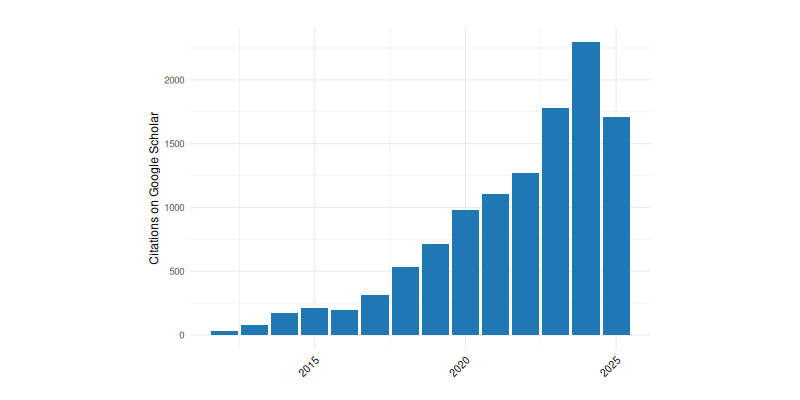

In [4]:
from rpy2.robjects.lib import ggplot2
from rpy2.robjects import pandas2ri
from rpy2.ipython.ggplot import image_png

pandas2ri.activate()
    
plot = ggplot2.ggplot(citations_by_year) \
        + ggplot2.aes_string(x='year', y='citations') \
        + ggplot2.geom_bar(stat='identity', position='stack', fill='#1f77b4') \
        + ggplot2.theme_minimal() \
        + ggplot2.scale_fill_hue() \
        + ggplot2.theme(**{'legend.position': 'right',
                           'aspect.ratio': .7},
                        **{'axis.text.x':
                            ggplot2.element_text(angle=45, size=10,
                                                 vjust=1, hjust=1)}) \
        + ggplot2.labs(title='', x='', y='Citations on Google Scholar')
plot.save('citations-by-year.pdf')
image_png(plot)

## Key terms used in publication titles and snippets

In [5]:
from collections import Counter, defaultdict

from stop_words import get_stop_words

stop_words = set(get_stop_words('en'))
# add stop words specific for the selection and citations in general
# including ngram stop words
stop_words.update(['common', 'crawl', 'common crawl', 'commoncrawl',
                   'the common crawl', 'the common', 'common crawl corpus',
                   'crawl corpus', 'common crawl,', 'trained on', 'crawl,',
                   '…', '...', 'et al.', 'et al.,', 'et', 'al.', 'al.,',
                   'of the', 'on the', 'in the', 'from the', 'for the',
                   '… the', '… we', 'and the', '… for', 'in this', 'in a',
                   'university of', 'page 1.', 'we use the',
                   '(pennington et al.,', 'et al., 2014)', 'skip to main',
                   'using', 'available', 'use', 'used', 'we use',
                   'also', 'however,', 'however', 'can', 'towards',
                   '1.', '2.', '3.'])

def word_and_ngrams(tokens, ngram_length=1):
    if ngram_length == 1:
        return tokens
    return [' '.join(tokens[i:i + j])
            for j in range(1, ngram_length)
            for i in range(len(tokens) - ngram_length + 1)]

def word_counts(citations, ngram_length=1):
    words = Counter()
    for c in citations:
        for t in [c['title'], c['snippet']]:
            tokens = str(t).split(' ')
            for word in word_and_ngrams(tokens, ngram_length):
                word = word.lower()
                if word in stop_words:
                    continue
                words[word] += 1
    return words

wc = word_counts(df.to_records(), 3)

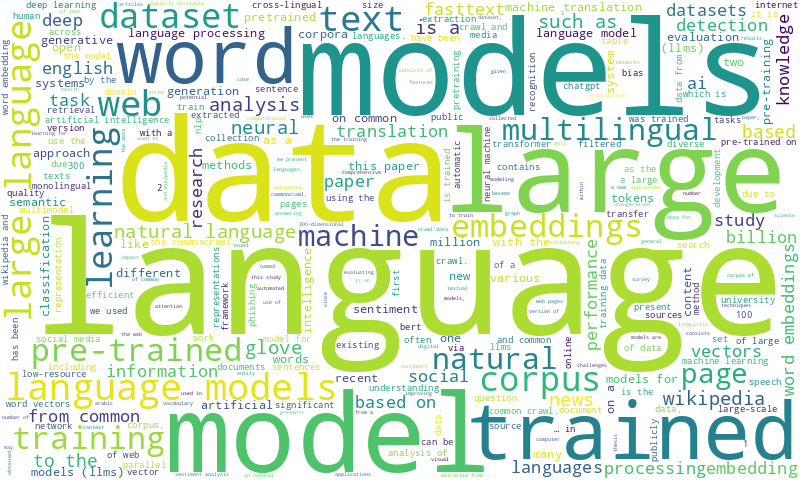

In [6]:
from wordcloud import WordCloud

wordcloud = WordCloud(width=800, height=480,
                      background_color=None, mode='RGBA', max_words=300) \
                .generate_from_frequencies(wc)

fig = wordcloud.to_image()
fig.save('ccf-scholar-wordcloud.pdf', transparent=True, bbox_inches='tight')
fig

In [7]:
import math
import matplotlib.pyplot as plt

years = [2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023, 2024, 2025]

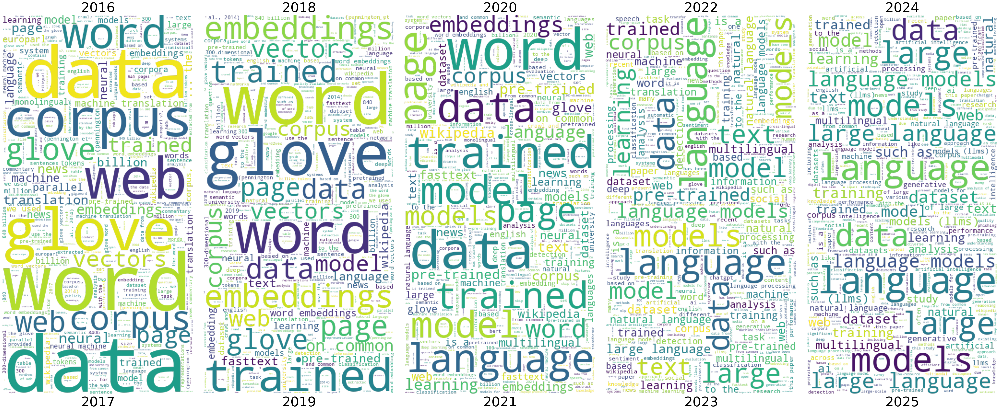

In [8]:
import math
import matplotlib.pyplot as plt

years = [2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023, 2024, 2025]


def word_clouds(data, ncols=5, width=400, height=400):

    nrows = math.ceil(len(data)/ncols)

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols,
                             figsize=[int(ncols*(10.0*width/height)),
                                      nrows*10])

    n = 0
    for sub in data:
        wordcloud = WordCloud(width=width, height=height,
                              background_color=None, mode='RGBA') \
                        .generate_from_frequencies(data[sub])
        #axis = axes[int(n/ncols),n%ncols]
        axis = axes[n%2,int(n/2)]
        axis.imshow(wordcloud)
        if (n % 2) == 0:
            axis.set_title(str(sub), fontsize=48)
        else:
            axis.set_title(str(sub), fontsize=48, y=-.07)
        axis.axis('off') # do not show x/y scale
        n += 1

    # fill the grid with empty subplots
    while n < (ncols*nrows):
        axes[int(n/ncols),n%ncols].axis('off') # do not show x/y scale
        n += 1

    fig.set_tight_layout(True)
    return fig

word_frequencies_by_year = dict()
for year in years:
    word_frequencies_by_year[year] = word_counts(df[df['year']==year].to_records(), 3)

fig = word_clouds(word_frequencies_by_year)
plt.show()

In [9]:
fig.savefig('ccf-scholar-wordclouds-2016-2025.pdf', transparent=True, bbox_inches='tight')

In [10]:
def row_to_text(row, cols=['title', 'snippet']):
    text = ''
    for col in cols:
        if text:
            text += '\t'
        text += str(row[col]).lower()
    return text
    
def df_to_corpus(df, cols=['title', 'snippet']):
    corpus = []
    for row in df.to_records():
        corpus.append(row_to_text(row))
    return '\n'.join(corpus)

In [11]:
# keyword extraction over all citations (title and snippet)

import yake

kwex = yake.KeywordExtractor(lan='en', n=3, dedupLim=.9, top=15, features=None)
kwex.stopword_set.update(stop_words)

terms = dict()
docs_by_year = Counter()
terms_by_year = Counter()

n_records = 0
for row in df.to_records():
    n_records += 1
    if (n_records % 500) == 0:
        print(n_records, 'records processed')
    year = row['year']
    docs_by_year[year] += 1
    text = row_to_text(row).lower()
    for kw in kwex.extract_keywords(text):
        (term, score) = kw
        if score < .0:
            # bug in yake: negative scores if n>3, see https://github.com/LIAAD/yake/issues/17
            continue
        terms_by_year[year] += 1
        if term in terms:
            terms[term][0] += 1
            terms[term][1] += score
            terms[term][2][year] += 1
        else:
            terms[term] = [1, score, Counter({year: 1})]

500 records processed
1000 records processed
1500 records processed
2000 records processed
2500 records processed
3000 records processed
3500 records processed
4000 records processed
4500 records processed
5000 records processed
5500 records processed
6000 records processed
6500 records processed
7000 records processed
7500 records processed
8000 records processed
8500 records processed
9000 records processed
9500 records processed
10000 records processed
10500 records processed


In [12]:
# rank terms by a combination of tf*idf and Yake's score

ranked_terms = dict()

for term in terms:
    (doc_freq, sum_score, yearly_counts) = terms[term]
    avg_score = sum_score / doc_freq
    for year in yearly_counts:
        frq = yearly_counts[year]
        if frq < 4:
            continue
        tf = (frq / terms_by_year[year])
        idf = math.log2(len(docs_by_year) / len(yearly_counts))
        if idf == .0:
            continue
        score = tf * idf - avg_score
        ranked_terms[(year, '%5d %.5f %.5f %.5f %.5f' % (frq, tf, idf, tf*idf, avg_score), term)] = score

ranked_terms = {k: v for k, v in sorted(ranked_terms.items(), key=lambda item: item[1], reverse=True)}

best_by_year = defaultdict(dict)
for year in docs_by_year:
    terms_of_year = list(filter(lambda i: i[0][0] == year, ranked_terms.items()))
    for t in terms_of_year[0:20]:
        print(t)
    for t in terms_of_year[0:50]:
        best_by_year[year][t[0][2]] = t[1]

((np.int64(2016), '    4 0.00136 0.15200 0.00021 0.01051', 'machine translation system'), np.float64(-0.010304160595813162))
((np.int64(2016), '    7 0.00238 1.00000 0.00238 0.02241', 'statistical machine translation'), np.float64(-0.020027663195853078))
((np.int64(2016), '    4 0.00136 0.15200 0.00021 0.03950', 'translation system'), np.float64(-0.03928834698729328))
((np.int64(2016), '    5 0.00170 0.15200 0.00026 0.04488', 'translation task'), np.float64(-0.04461766068524313))
((np.int64(2016), '    6 0.00204 1.00000 0.00204 0.04717', 'statistical machine'), np.float64(-0.045124668946943294))
((np.int64(2016), '    6 0.00204 0.15200 0.00031 0.04821', 'language model'), np.float64(-0.04790201803171556))
((np.int64(2016), '    4 0.00136 0.32193 0.00044 0.08352', 'sentence pairs'), np.float64(-0.08307728706969299))
((np.int64(2016), '    4 0.00136 0.32193 0.00044 0.10314', 'glove word vectors'), np.float64(-0.10270174534659124))
((np.int64(2016), '   10 0.00340 0.15200 0.00052 0.11699'

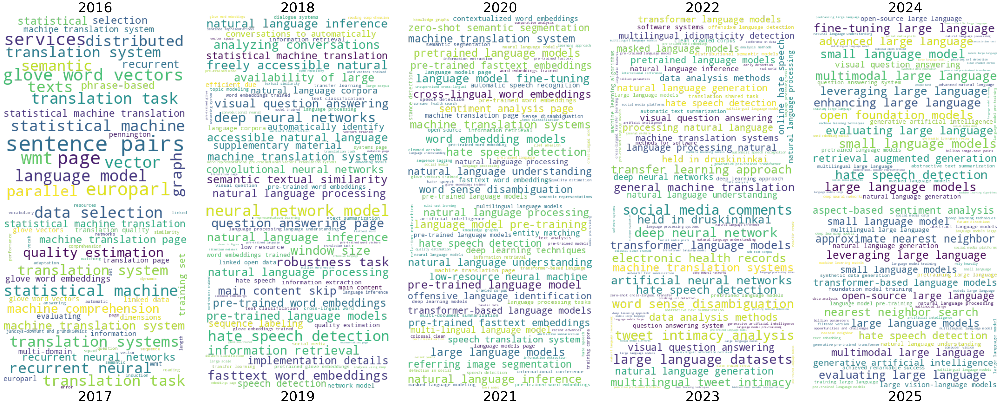

In [13]:
fig = word_clouds(best_by_year, 5, 400, 400)
fig.savefig('ccf-scholar-wordclouds-phrases-2016-2025.pdf', transparent=True, bbox_inches='tight')
plt.show()